In [1]:
import pandas as pd
import numpy as np

In [5]:
df = pd.read_csv(r"C:\Users\tejas\Downloads\Car details v3.csv")
df.head().T.style.set_properties(**{'background-color':'#2a9d8f', 'color':'white', 'border':'2.5px solid black'})

,0,1,2,3,4
name,Maruti Swift Dzire VDI,Skoda Rapid 1.5 TDI Ambition,Honda City 2017-2020 EXi,Hyundai i20 Sportz Diesel,Maruti Swift VXI BSIII
year,2014,2014,2006,2010,2007
selling_price,450000,370000,158000,225000,130000
km_driven,145500,120000,140000,127000,120000
fuel,Diesel,Diesel,Petrol,Diesel,Petrol
seller_type,Individual,Individual,Individual,Individual,Individual
transmission,Manual,Manual,Manual,Manual,Manual
owner,First Owner,Second Owner,Third Owner,First Owner,First Owner
mileage,23.4 kmpl,21.14 kmpl,17.7 kmpl,23.0 kmpl,16.1 kmpl
engine,1248 CC,1498 CC,1497 CC,1396 CC,1298 CC


In [6]:
cr = df.drop(columns=['torque','seller_type','max_power'])

In [7]:
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   transmission   8128 non-null   object 
 6   owner          8128 non-null   object 
 7   mileage        7907 non-null   object 
 8   engine         7907 non-null   object 
 9   seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(6)
memory usage: 635.1+ KB


In [8]:
cr.isnull().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
transmission       0
owner              0
mileage          221
engine           221
seats            221
dtype: int64

# Cleaning

1. Name is very long split the name into Brand and Name
2. mileage has nan values
 --covert datatype  from object to float
3. engine has nan values
 --covert datatype  from object to float
4. seats has nan values 

In [9]:
# mileage
# removing 'kmpl' & 'km/kg' from mileage
cr['mileage'] = cr['mileage'].str.replace(' kmpl', '').str.replace(' km/kg', '')
cr['mileage'].astype(float)

0       23.40
1       21.14
2       17.70
3       23.00
4       16.10
        ...  
8123    18.50
8124    16.80
8125    19.30
8126    23.57
8127    23.57
Name: mileage, Length: 8128, dtype: float64

In [10]:
# engine
# remove 'CC' from column engine
cr['engine'] = cr['engine'].str.replace('CC','')
cr['engine'].astype(float)

0       1248.0
1       1498.0
2       1497.0
3       1396.0
4       1298.0
         ...  
8123    1197.0
8124    1493.0
8125    1248.0
8126    1396.0
8127    1396.0
Name: engine, Length: 8128, dtype: float64

In [11]:
# I have owner name as First Owner,Second Owner,Thied Owmer & so on....
cr['owner'] = cr['owner'].str.replace('First Owner','1').str.replace('Second Owner','2').str.replace('Third Owner','3').str.replace('Fourth & Above Owner','4').str.replace('Test Drive Car','5')
cr['owner']

0       1
1       2
2       3
3       1
4       1
       ..
8123    1
8124    4
8125    1
8126    1
8127    1
Name: owner, Length: 8128, dtype: object

In [12]:
## I notice my i dont have any name of brand
cr['Brand'] = cr['name'].str.split(' ').str[0].astype('category') #Separating Brand name from the Name

In [13]:
# I have veru long name of car in my data
cr['name'] = cr['name'].str.split(' ').str.slice(1,2).str.join(' ')
cr['name'].astype('category')

0        Swift
1        Rapid
2         City
3          i20
4        Swift
         ...  
8123       i20
8124     Verna
8125     Swift
8126    Indigo
8127    Indigo
Name: name, Length: 8128, dtype: category
Categories (207, object): ['3', '309', '5', '6', ..., 'Zen', 'Zest', 'i10', 'i20']

In [14]:
#cr['name'].str.split().str.slice(1,2)

In [15]:
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   name           8128 non-null   object  
 1   year           8128 non-null   int64   
 2   selling_price  8128 non-null   int64   
 3   km_driven      8128 non-null   int64   
 4   fuel           8128 non-null   object  
 5   transmission   8128 non-null   object  
 6   owner          8128 non-null   object  
 7   mileage        7907 non-null   object  
 8   engine         7907 non-null   object  
 9   seats          7907 non-null   float64 
 10  Brand          8128 non-null   category
dtypes: category(1), float64(1), int64(3), object(6)
memory usage: 644.4+ KB


In [16]:
# remove Nan values
car = cr.dropna()
car.reset_index(inplace=False)

,index,name,year,selling_price,km_driven,fuel,transmission,owner,mileage,engine,seats,Brand
0,0,Swift,2014,450000,145500,Diesel,Manual,1,23.4,1248,5.0,Maruti
1,1,Rapid,2014,370000,120000,Diesel,Manual,2,21.14,1498,5.0,Skoda
2,2,City,2006,158000,140000,Petrol,Manual,3,17.7,1497,5.0,Honda
3,3,i20,2010,225000,127000,Diesel,Manual,1,23.0,1396,5.0,Hyundai
4,4,Swift,2007,130000,120000,Petrol,Manual,1,16.1,1298,5.0,Maruti
...,...,...,...,...,...,...,...,...,...,...,...,...
7902,8123,i20,2013,320000,110000,Petrol,Manual,1,18.5,1197,5.0,Hyundai
7903,8124,Verna,2007,135000,119000,Diesel,Manual,4,16.8,1493,5.0,Hyundai
7904,8125,Swift,2009,382000,120000,Diesel,Manual,1,19.3,1248,5.0,Maruti
7905,8126,Indigo,2013,290000,25000,Diesel,Manual,1,23.57,1396,5.0,Tata


In [17]:
car = car[car['selling_price']<8e6].reset_index(drop =True)

In [18]:
car.T.style.set_properties(**{'background-color':'#2a9d8f', 'color':'white', 'border':'2.5px solid black'})

In [19]:
car["mileage"]=car.mileage.astype(float)
car["engine"]=car.engine.astype(int)
car["owner"]=car.owner.astype(int)
car["Brand"]=car.Brand.astype(str)

In [20]:
car.to_csv('Cleaned car dataset')

In [21]:
car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7906 entries, 0 to 7905
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           7906 non-null   object 
 1   year           7906 non-null   int64  
 2   selling_price  7906 non-null   int64  
 3   km_driven      7906 non-null   int64  
 4   fuel           7906 non-null   object 
 5   transmission   7906 non-null   object 
 6   owner          7906 non-null   int32  
 7   mileage        7906 non-null   float64
 8   engine         7906 non-null   int32  
 9   seats          7906 non-null   float64
 10  Brand          7906 non-null   object 
dtypes: float64(2), int32(2), int64(3), object(4)
memory usage: 617.8+ KB


In [22]:
car.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'transmission',
       'owner', 'mileage', 'engine', 'seats', 'Brand'],
      dtype='object')

In [23]:
car

,name,year,selling_price,km_driven,fuel,transmission,owner,mileage,engine,seats,Brand
0,Swift,2014,450000,145500,Diesel,Manual,1,23.40,1248,5.0,Maruti
1,Rapid,2014,370000,120000,Diesel,Manual,2,21.14,1498,5.0,Skoda
2,City,2006,158000,140000,Petrol,Manual,3,17.70,1497,5.0,Honda
3,i20,2010,225000,127000,Diesel,Manual,1,23.00,1396,5.0,Hyundai
4,Swift,2007,130000,120000,Petrol,Manual,1,16.10,1298,5.0,Maruti
...,...,...,...,...,...,...,...,...,...,...,...
7901,i20,2013,320000,110000,Petrol,Manual,1,18.50,1197,5.0,Hyundai
7902,Verna,2007,135000,119000,Diesel,Manual,4,16.80,1493,5.0,Hyundai
7903,Swift,2009,382000,120000,Diesel,Manual,1,19.30,1248,5.0,Maruti
7904,Indigo,2013,290000,25000,Diesel,Manual,1,23.57,1396,5.0,Tata


In [25]:
car.describe().T.style.set_properties(**{'background-color':'#2a9d8f', 'color':'white', 'border':'2.5px solid black'})

,count,mean,std,min,25%,50%,75%,max
year,7906.000000,2013.981786,3.866746,1994.000000,2012.000000,2015.000000,2017.000000,2020.000000
selling_price,7906.000000,648558.977612,806781.759276,29999.000000,270000.000000,450000.000000,690000.000000,7200000.000000
km_driven,7906.000000,69197.513787,56791.642546,1.000000,35000.000000,60000.000000,95875.000000,2360457.000000
owner,7906.000000,1.447382,0.710864,1.000000,1.000000,1.000000,2.000000,5.000000
mileage,7906.000000,19.415927,4.029403,0.000000,16.780000,19.300000,22.320000,33.440000
engine,7906.000000,1458.560460,503.915477,624.000000,1197.000000,1248.000000,1582.000000,3604.000000
seats,7906.000000,5.416899,0.959516,2.000000,5.000000,5.000000,5.000000,14.000000


# Vidulization

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

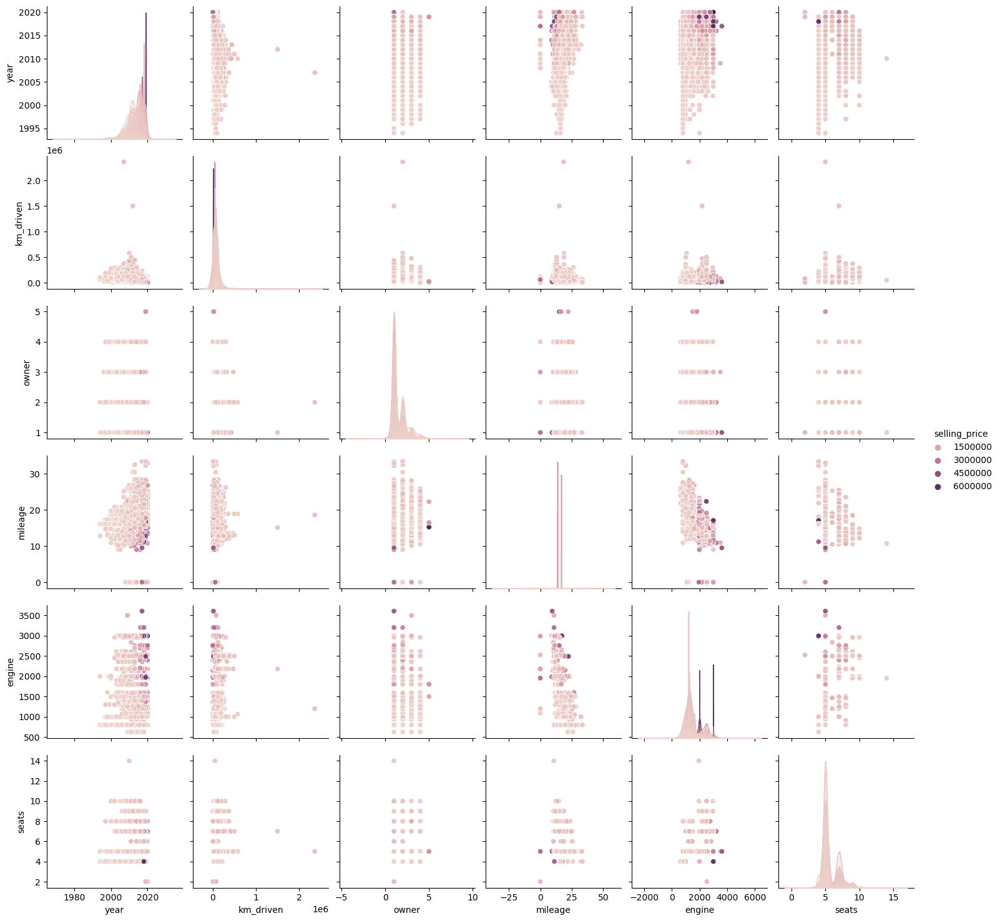

In [27]:
sns.pairplot(car,hue ='selling_price')

<Axes: >

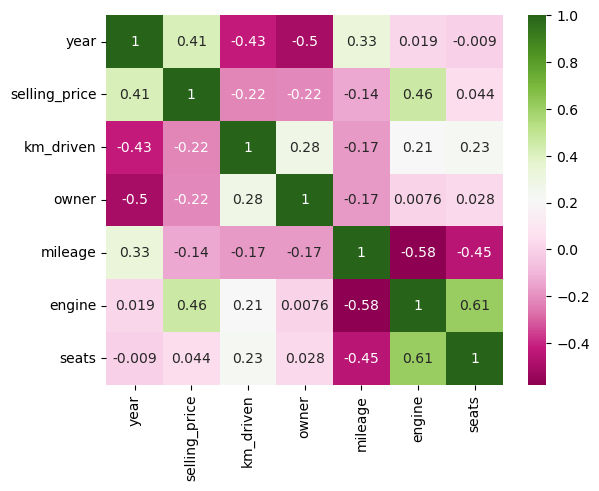

In [28]:
co = car[['year', 'selling_price', 'km_driven','owner', 'mileage', 'engine', 'seats']].corr()
sns.heatmap(co,cmap="PiYG",annot=True)

In [29]:
# total count of Car by Brand
fig = px.histogram(car,x = 'Brand',
                   labels={'Brand':'name'},
                  title='Manifacture of Car',
                  color_discrete_sequence=['green'])
fig.show()

In [30]:

fig = px.bar(car,x = 'fuel',
                   labels={'fuel':''},
                  title='FUel type of Car',
                  color_discrete_sequence=['red'])
fig.show()

In [31]:
car['fuel'].value_counts()

Diesel    4299
Petrol    3519
CNG         53
LPG         35
Name: fuel, dtype: int64

In [32]:
# Distribution ofFuel by using pie chart
data = {'Fuel Type': ['Diesel', 'Petrol', 'CNG', 'LPG'],
        'Count': [4299, 3519, 53, 35]}

df = pd.DataFrame(data)

fig = px.pie(df, values='Count', names='Fuel Type', title='Fuel Type Distribution')
fig.show()

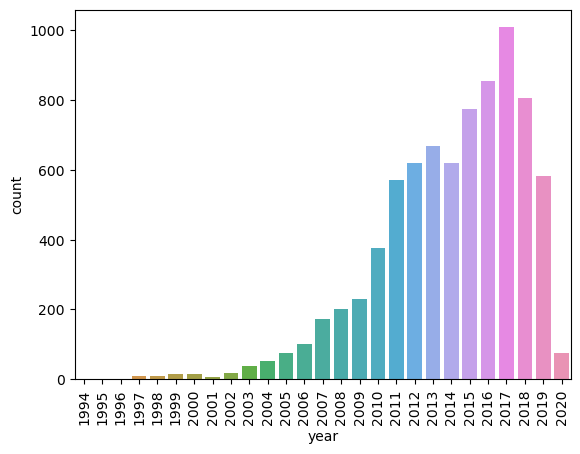

In [33]:
#Coubt of car Yewar wise
ax = sns.countplot(data=car, x=car['year'])
ax.tick_params(axis='x', rotation=90)

In [34]:
car['transmission'].value_counts()

Manual       6866
Automatic    1040
Name: transmission, dtype: int64

In [35]:
da ={'Transmission':['Manual','Automatic'],
     'Cnt': [6866,1040]} 
dz = pd.DataFrame(da)
tr_pie = px.pie(dz, values='Cnt', names='Transmission', title='Transmission Type Distribution')
tr_pie.show()

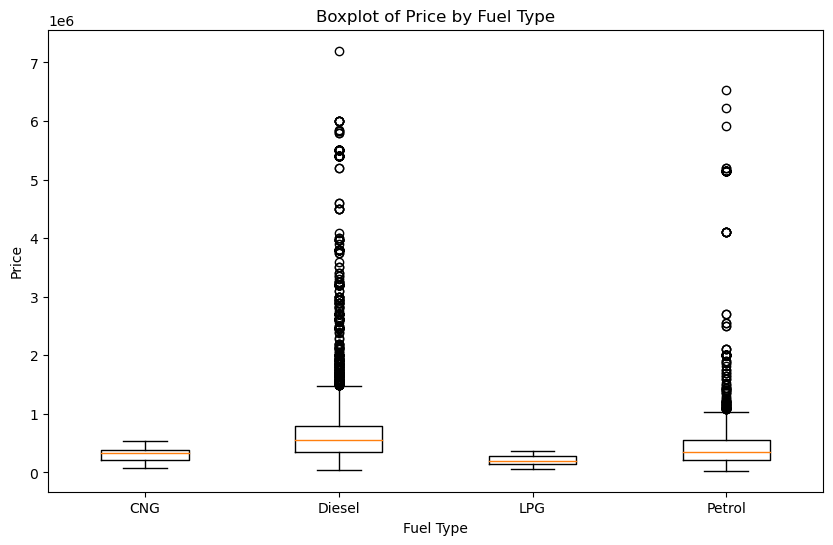

In [36]:
grouped_data = car.groupby('fuel')
car_plot = [group['selling_price'].tolist() for _, group in grouped_data]
plt.figure(figsize=(10, 6))
plt.boxplot(car_plot, labels=grouped_data.groups.keys())
plt.title('Boxplot of Price by Fuel Type')
plt.xlabel('Fuel Type')
plt.ylabel('Price')
plt.show()

In [37]:
car['fuel'] = car['fuel'].map({'Petrol':1,'Diesel':2,'CNG':3,'LPG':4})

In [38]:
#transmission
car['transmission'] = car['transmission'].map({'Manual':1,'Automatic':2})

In [39]:
car['engine'].astype(int)

0       1248
1       1498
2       1497
3       1396
4       1298
        ... 
7901    1197
7902    1493
7903    1248
7904    1396
7905    1396
Name: engine, Length: 7906, dtype: int32

In [40]:
car

,name,year,selling_price,km_driven,fuel,transmission,owner,mileage,engine,seats,Brand
0,Swift,2014,450000,145500,2,1,1,23.40,1248,5.0,Maruti
1,Rapid,2014,370000,120000,2,1,2,21.14,1498,5.0,Skoda
2,City,2006,158000,140000,1,1,3,17.70,1497,5.0,Honda
3,i20,2010,225000,127000,2,1,1,23.00,1396,5.0,Hyundai
4,Swift,2007,130000,120000,1,1,1,16.10,1298,5.0,Maruti
...,...,...,...,...,...,...,...,...,...,...,...
7901,i20,2013,320000,110000,1,1,1,18.50,1197,5.0,Hyundai
7902,Verna,2007,135000,119000,2,1,4,16.80,1493,5.0,Hyundai
7903,Swift,2009,382000,120000,2,1,1,19.30,1248,5.0,Maruti
7904,Indigo,2013,290000,25000,2,1,1,23.57,1396,5.0,Tata


In [41]:
car.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'transmission',
       'owner', 'mileage', 'engine', 'seats', 'Brand'],
      dtype='object')

# ML ALGORITHEM

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import PoissonRegressor
from sklearn.svm import SVR
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score, roc_curve, confusion_matrix, classification_report, roc_auc_score

# LINEAR REGRESSION

In [43]:
x = car.drop(['selling_price'],axis = 1)
#x

In [44]:
y = car['selling_price']
#y

In [45]:
#Spliiting the data
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=10)

In [46]:
one_hot=OneHotEncoder()
one_hot.fit(x[["name","Brand"]])

OneHotEncoder()

In [47]:
col_trans = make_column_transformer((OneHotEncoder(categories=one_hot.categories_),['name','Brand']),
                                   remainder='passthrough')

One hot encoding is a technique that we use to represent 
categorical variables as numerical values in a machine learning model.

In [48]:
#col_trans
lr = LinearRegression()
pipe = make_pipeline(col_trans,lr)
pipe.fit(x_train,y_train)
y_pred=pipe.predict(x_test)
metrics.r2_score(y_test,y_pred)

0.8489687880071629

In [49]:
pipe.predict(pd.DataFrame([['Safari',2020,2500,1,1,1,15,1199,5.0,'Tata']],columns=['name', 'year', 'km_driven', 'fuel', 'transmission',
       'owner', 'mileage', 'engine', 'seats', 'Brand']))

array([500612.72055097])

Accuracy of Linear Regression Model is 84%

# DESCISION TREE REGRESSION

In [50]:
#X= car.drop(["selling_price","name","Brand"],axis = 1)

In [51]:
#Y= car['selling_price']

In [52]:
X_train,X_test,Y_train,Y_test = train_test_split(x,y,test_size=0.3,random_state=10)

In [53]:
tr_reg = DecisionTreeRegressor(random_state=0)

In [54]:
pipe_line2=make_pipeline(col_trans,tr_reg)

In [55]:
pipe_line2.fit(x_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(categories=[array(['3', '5', '6', '7', '800', 'A-Star', 'A3', 'A4', 'A6', 'Accent',
       'Accord', 'Alto', 'Amaze', 'Ameo', 'Aria', 'Aspire', 'Astra',
       'Aveo', 'Avventura', 'B', 'BR-V', 'BRV', 'Baleno', 'Beat',
       'Bolero', 'Bolt', 'Brio', 'CLA', 'CLASSIC', 'CR-V'...
                                                                            array(['Ambassador', 'Ashok', 'Audi', 'BMW', 'Chevrolet', 'Daewoo',
       'Datsun', 'Fiat', 'Force', 'Ford', 'Honda', 'Hyundai', 'Isuzu',
       'Jaguar', 'Jeep', 'Kia', 'Land', 'Lexus', 'MG', 'Mahindra',
       'Maruti', 'Mercedes-Benz', 'Mitsubishi', 'Nissan', 'Opel',
       'Renault', 'Skoda', 'Tata', 'Toyota', 'Volkswagen', 'Volvo'],
      dtype=object)]),
                                                  ['name', 'Brand'])])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=0))])

In [56]:
y_pred2=pipe_line2.predict(x_test)

In [57]:
r2_score(y_test, y_pred)

0.8489687880071629

In [58]:
pipe_line2.predict(pd.DataFrame([['Safari',2020,2500,1,1,1,15,1199,5.0,'Tata']],columns=['name', 'year', 'km_driven', 'fuel', 'transmission',
       'owner', 'mileage', 'engine', 'seats', 'Brand']))

array([537000.])

Accuracy of Descision Tree Regression Model is 84%

# Random Forest Regressor

In [59]:
rf=RandomForestRegressor()

In [60]:
pipe_line3=make_pipeline(col_trans,rf)

In [61]:
pipe_line3.fit(x_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(categories=[array(['3', '5', '6', '7', '800', 'A-Star', 'A3', 'A4', 'A6', 'Accent',
       'Accord', 'Alto', 'Amaze', 'Ameo', 'Aria', 'Aspire', 'Astra',
       'Aveo', 'Avventura', 'B', 'BR-V', 'BRV', 'Baleno', 'Beat',
       'Bolero', 'Bolt', 'Brio', 'CLA', 'CLASSIC', 'CR-V'...
                                                                            array(['Ambassador', 'Ashok', 'Audi', 'BMW', 'Chevrolet', 'Daewoo',
       'Datsun', 'Fiat', 'Force', 'Ford', 'Honda', 'Hyundai', 'Isuzu',
       'Jaguar', 'Jeep', 'Kia', 'Land', 'Lexus', 'MG', 'Mahindra',
       'Maruti', 'Mercedes-Benz', 'Mitsubishi', 'Nissan', 'Opel',
       'Renault', 'Skoda', 'Tata', 'Toyota', 'Volkswagen', 'Volvo'],
      dtype=object)]),
                                                  ['name', 'Brand'])])),
                ('randomforestregressor', RandomForestRegressor())])

In [62]:
y_pred3=pipe_line3.predict(x_test)

In [63]:
r2_score(y_test, y_pred3)

0.9716724964381154

Accuracy of Random Forest Regressor is 96%

# KNeighbors Regressor

In [65]:
from sklearn.neighbors import KNeighborsRegressor

In [66]:
knr = KNeighborsRegressor()

In [67]:
pipe_line4=make_pipeline(col_trans,knr)

In [68]:
pipe_line4.fit(x_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(categories=[array(['3', '5', '6', '7', '800', 'A-Star', 'A3', 'A4', 'A6', 'Accent',
       'Accord', 'Alto', 'Amaze', 'Ameo', 'Aria', 'Aspire', 'Astra',
       'Aveo', 'Avventura', 'B', 'BR-V', 'BRV', 'Baleno', 'Beat',
       'Bolero', 'Bolt', 'Brio', 'CLA', 'CLASSIC', 'CR-V'...
                                                                            array(['Ambassador', 'Ashok', 'Audi', 'BMW', 'Chevrolet', 'Daewoo',
       'Datsun', 'Fiat', 'Force', 'Ford', 'Honda', 'Hyundai', 'Isuzu',
       'Jaguar', 'Jeep', 'Kia', 'Land', 'Lexus', 'MG', 'Mahindra',
       'Maruti', 'Mercedes-Benz', 'Mitsubishi', 'Nissan', 'Opel',
       'Renault', 'Skoda', 'Tata', 'Toyota', 'Volkswagen', 'Volvo'],
      dtype=object)]),
                                                  ['name', 'Brand'])])),
                ('kneighborsregressor', KNeighborsRegressor())])

In [69]:
y_pred4=pipe_line4.predict(x_test)

In [70]:
r2_score(y_test, y_pred4)

0.8099075050565276

In [71]:
pipe_line4.predict(pd.DataFrame([['Safari',2020,2500,1,1,1,15,1199,5.0,'Tata']],columns=['name', 'year', 'km_driven', 'fuel', 'transmission',
       'owner', 'mileage', 'engine', 'seats', 'Brand']))

array([761000.])

Accuracy of KNeighbors is 80%

From the above Regression model we can conclude that Random Forest Regressor has more accuracy than other models which is 96%

###### Random  forest   accurancy 96

In [64]:
pipe_line3.predict(pd.DataFrame([['Safari',2020,2500,1,1,1,15,1199,5.0,'Tata']],columns=['name', 'year', 'km_driven', 'fuel', 'transmission',
       'owner', 'mileage', 'engine', 'seats', 'Brand']))

array([615529.89])